In [67]:
from pdf2image import convert_from_path

In [68]:
pages = convert_from_path(r'docs\prescription\pre_1.pdf',\
                          poppler_path=r"C:\Users\Amit Vikram Raj\poppler-22.12.0\Library\bin")

In [69]:
len(pages)

1

In [70]:
# pages[0].show()

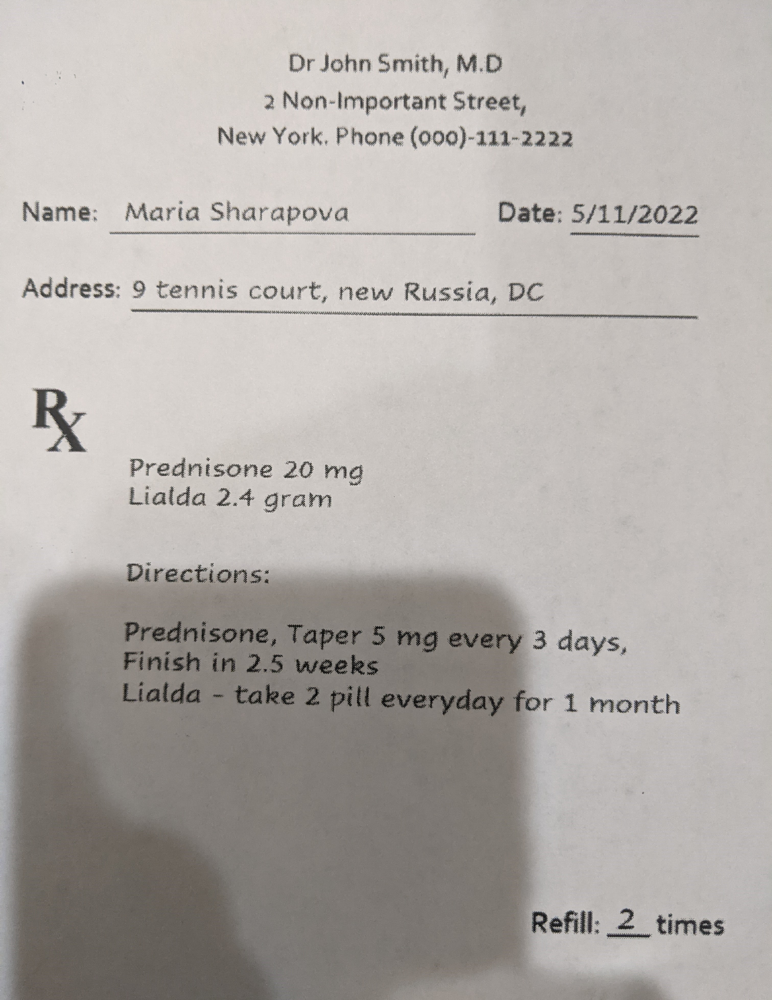

In [71]:
pages[0]

In [72]:
import pytesseract

In [73]:
pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"
text = pytesseract.image_to_string(pages[0], lang='eng')
print(text)

Dr John Smith, M.D
2 Non-Important Street,
New York, Phone (000)-111-2222

Name: Maria Sharapova Date: 5/11/2022

Address: 9 tennis court, new Russia, DC

—momennannenncmneneunnmnnnnninsissiyoinnitnahaadaanih issn earnttneenrenen:

Prednisone 20 mg
Lialda 2.4 gram

3 days,

or 1 month



In [74]:
import numpy as np
import cv2 as cv
from PIL import Image

In [75]:
def pre_process_img(img):
    
    # if color img, convert to gray
    gray = cv.cvtColor(src=np.array(img), code=cv.COLOR_BGR2GRAY)
    
    # resize the image - making the image bigger for better pixel visibility to get better results
    resized_img = cv.resize(src=gray, dsize=None, fx=1.5, fy=1.5, interpolation=cv.INTER_LINEAR)
    
    processed_img = cv.adaptiveThreshold(src=resized_img, 
                                        maxValue=255,
                                        adaptiveMethod = cv.ADAPTIVE_THRESH_GAUSSIAN_C,
                                        thresholdType = cv.THRESH_BINARY,
                                        blockSize=61,
                                        C=11)
    
    return processed_img

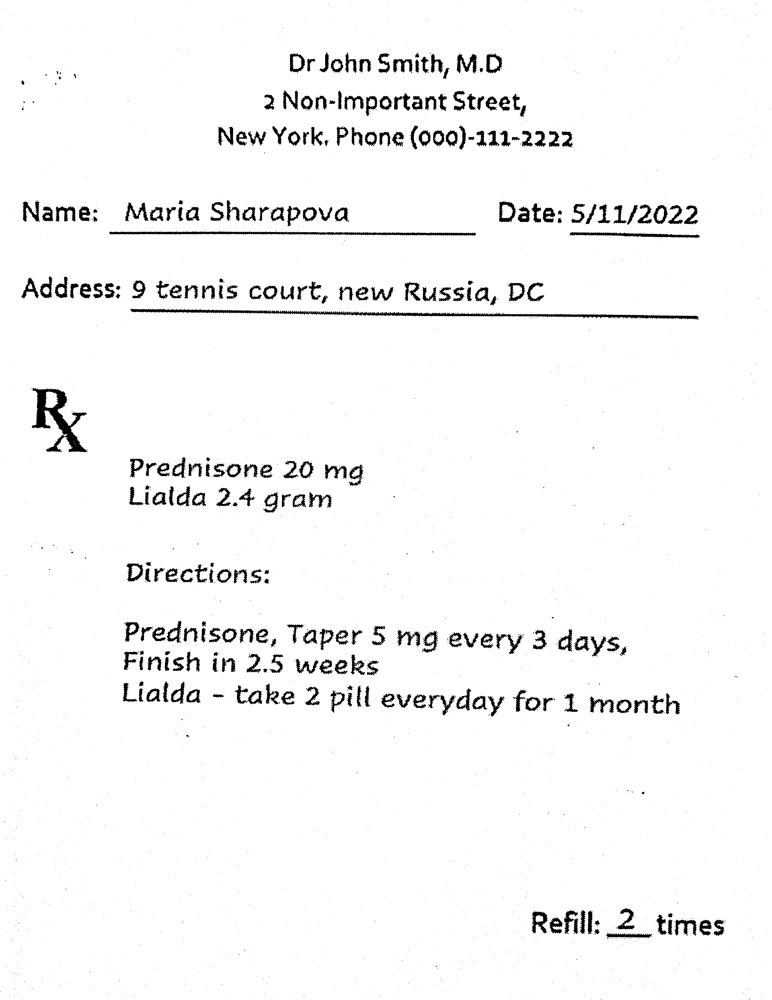

In [76]:
img = pre_process_img(pages[0])
Image.fromarray(img)

In [77]:
pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"
text = pytesseract.image_to_string(img, lang='eng')
print(text)

Dr John Smith, M.D
2 Non-Important Street,
New York, Phone (000)-111-2222

Name: Marta Sharapova Date: 5/11/2022

Address: 9 tennis court, new Russia, DC

K

Prednisone 20 mg
Lialda 2.4 gram

Directions:

Prednisone, Taper 5 mg every 3 days,
Finish in 2.5 weeks a
Lialda - take 2 pill everyday for 1 month

Refill: 2 times



In [78]:
import re

In [79]:
name_pattern = "Name: (.*) Date:" # . -> captures any single charecter, () -> finds only that within (...)

matches = re.findall(name_pattern,text)
matches[0].strip()

'Marta Sharapova'

In [80]:
address_pattern = "Address: (.*)\n"
matches = re.findall(address_pattern,text)
matches[0].strip()

'9 tennis court, new Russia, DC'

In [81]:
medicines_pattern = "Address:[^\n]*(.*)Directions:"
matches = re.findall(medicines_pattern,text, flags=re.DOTALL)
matches[0].strip()
# matches[0].strip().split('\n')

'K\n\nPrednisone 20 mg\nLialda 2.4 gram'

In [93]:
directions_pattern = "Directions:(.*)Refill:"

matches = re.findall(directions_pattern, text, flags=re.DOTALL)
matches[0].strip()

'Prednisone, Taper 5 mg every 3 days,\nFinish in 2.5 weeks a\nLialda - take 2 pill everyday for 1 month'

In [83]:
refill_pattern = "Refill:(.*)times"

matches = re.findall(refill_pattern,text)
matches[0].strip()

'2'

In [84]:
pages = convert_from_path(r'docs\prescription\pre_2.pdf',\
                          poppler_path=r"C:\Users\Amit Vikram Raj\poppler-22.12.0\Library\bin")

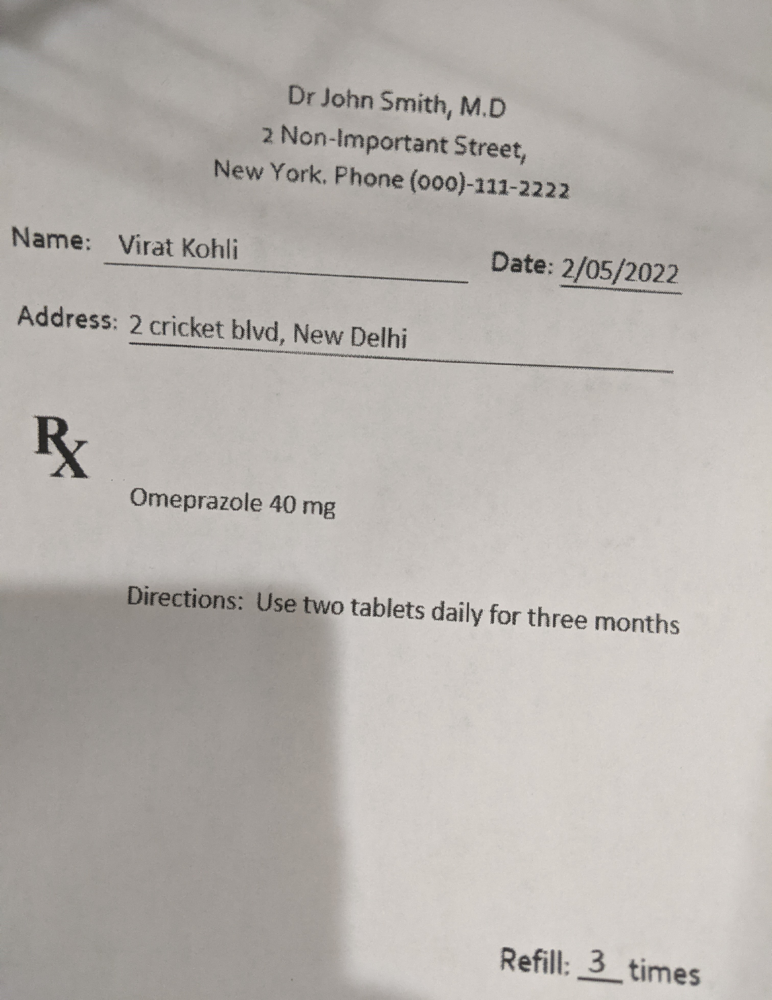

In [85]:
pages[0]

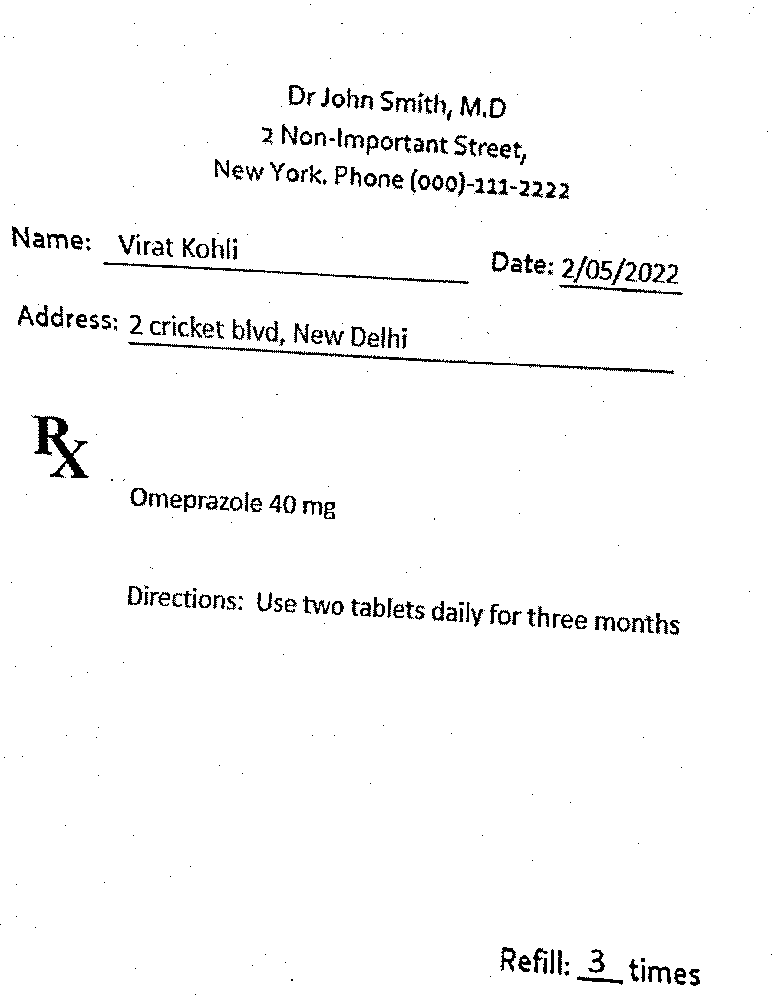

In [86]:
img = pre_process_img(pages[0])
Image.fromarray(img)

In [87]:
pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"
text1 = pytesseract.image_to_string(img, lang='eng')
print(text1)

Dr John >mith, M.D

2 Non-Important street,
New York, Phone (900)-323- ~2222

Name:  Virat Kohli Date: 2/05/2022

Address: 2 cricket blvd, New Delhi

| Omeprazole 40 mg

Directions: Use two tablets daily for three months

Refill: 3 times



In [88]:
name_pattern = "Name: (.*) Date:" # . -> captures any single charecter, () -> finds only that within (...)

matches = re.findall(name_pattern,text1)
matches[0].strip()

'Virat Kohli'

In [89]:
address_pattern = "Address: (.*)\n"
matches = re.findall(address_pattern,text1)
matches[0].strip()

'2 cricket blvd, New Delhi'

In [90]:
medicines_pattern = "Address:[^\n]*(.*)Directions:"
matches = re.findall(medicines_pattern,text1, flags=re.DOTALL)
matches[0].strip()
# matches[0].strip().split('\n')

'| Omeprazole 40 mg'

In [91]:
directions_pattern = "Directions:(.*)Refill:"

matches = re.findall(directions_pattern, text1, flags=re.DOTALL)
matches[0].strip()

'Use two tablets daily for three months'

In [92]:
refill_pattern = "Refill:(.*)times"

matches = re.findall(refill_pattern,text1)
matches[0].strip()

'3'